# ND2 import

In [11]:
import nd2
import cv2
import tifffile
import numpy as np
from tifffile import TiffFile
import matplotlib.pyplot as plt

In [ ]:
im_array = nd2.imread("./../data/240922_mattLines.nd2")

In [8]:
with nd2.ND2File('./../data/240922_mattLines.nd2') as ndfile:
    print(ndfile.metadata)  # Access various metadata fields
    print(ndfile.attributes)

Metadata(contents=Contents(channelCount=1, frameCount=3280), channels=[Channel(channel=ChannelMeta(name='Halogen', index=0, color=Color(r=255, g=255, b=255, a=1.0), emissionLambdaNm=None, excitationLambdaNm=None), loops=LoopIndices(NETimeLoop=0, TimeLoop=None, XYPosLoop=1, ZStackLoop=None), microscope=Microscope(objectiveMagnification=10.0, objectiveName='Plan Fluor 10x DIC L', objectiveNumericalAperture=0.3, zoomMagnification=1.0, immersionRefractiveIndex=1.0, projectiveMagnification=None, pinholeDiameterUm=None, modalityFlags=['brightfield']), volume=Volume(axesCalibrated=(True, True, False), axesCalibration=(0.64523075194182, 0.64523075194182, 1.0), axesInterpretation=('distance', 'distance', 'distance'), bitsPerComponentInMemory=16, bitsPerComponentSignificant=14, cameraTransformationMatrix=(-0.9998415422032162, -0.017801418052906786, 0.017801418052906786, -0.9998415422032162), componentCount=1, componentDataType='unsigned', voxelCount=(1392, 1040, 1), componentMaxima=[0.0], compon

In [ ]:
def my_normalize(image_array):
    # get min and max of each subarray
    normalized_subarray = []
    for subarray in image_array:
        min_val = np.min(subarray)
        max_val = np.max(subarray)
        if max_val - min_val == 0:
            normalized_subarray = np.zeros_like(subarray)
        else:
            normalized_subarray = (subarray - min_val) / (max_val - min_val)
        normalized_subarray.append(norm)

In [14]:
my_tiff = "./../data/training/training.tif"
my_images = []
with TiffFile(my_tiff) as tif:
    for page in tif.pages:
        image = page.asarray().normal
        my_images.append(image)

In [28]:
print(str(my_images[0]) + " with a length of: " + str(len(my_images[0])))
print(str(my_images[0][0]) + " with a length of: " + str(len(my_images[0][0])))
print(str(my_images[0][0][0]))

[[5189 5187 5216 ... 5439 5635 5627]
 [5103 5168 5038 ... 5567 5516 5589]
 [5175 5099 5221 ... 5607 5581 5471]
 ...
 [5090 5107 5087 ... 5481 5427 5404]
 [5105 5140 5144 ... 5484 5515 5439]
 [5137 5042 5120 ... 5509 5467 5490]] with a length of: 1040
[5189 5187 5216 ... 5439 5635 5627] with a length of: 1392
5189


From the above output, it appears that what we have is pixel values in an array for each column of pixels, X. Each row is in an array (vector). Each row/array/vector is also organized in an array, one row for each Y pixel. Another way of explaining this is that it is an array of 1040 (height of image, Y) vectors of 1392 (width of image, X) integer values, each representing a pixel value.

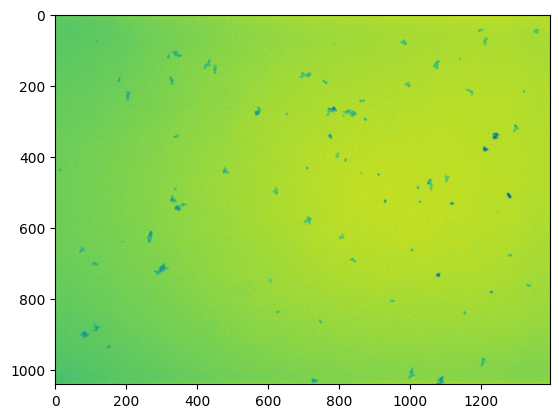

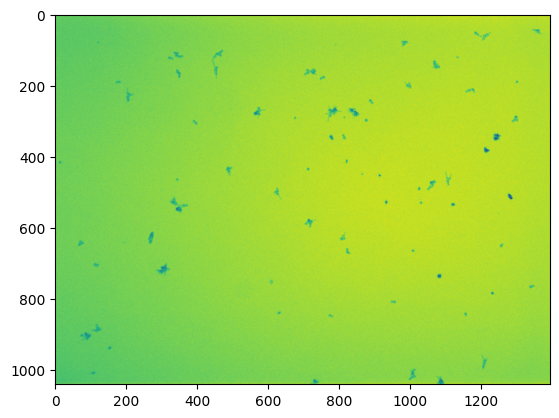

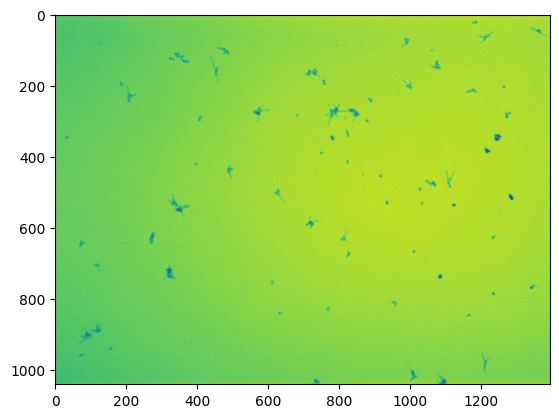

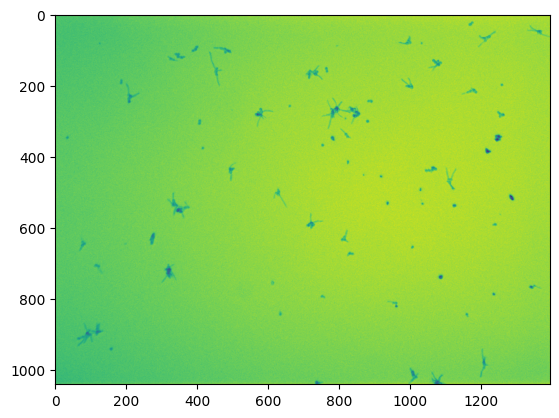

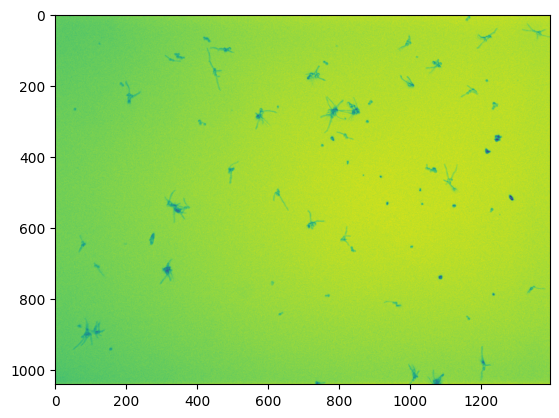

...

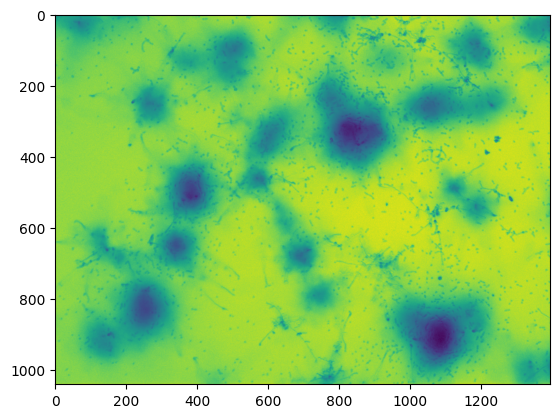

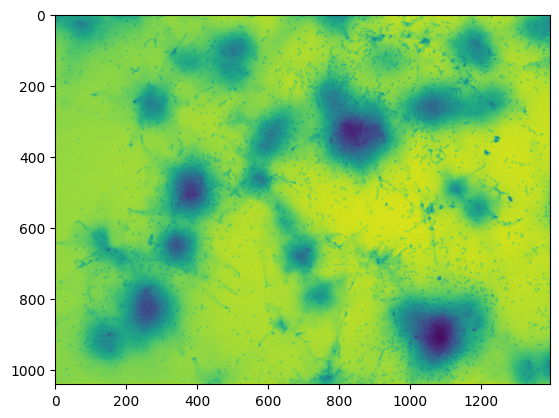

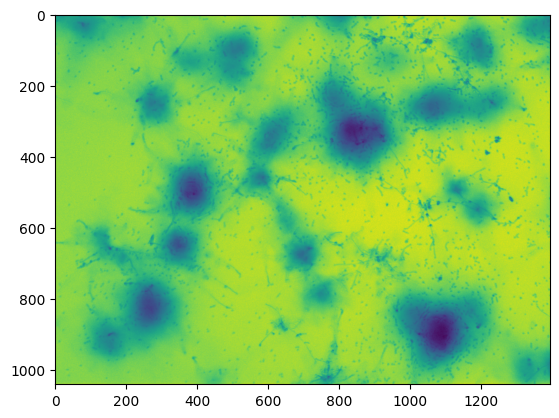

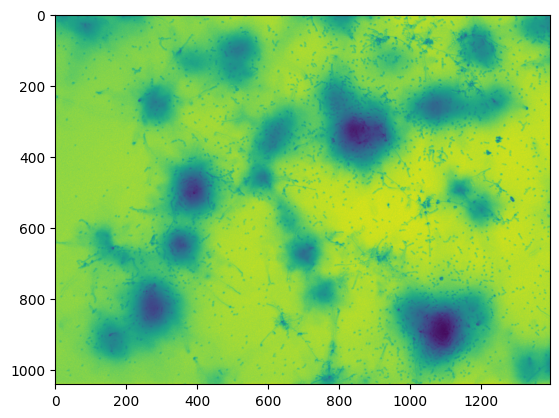

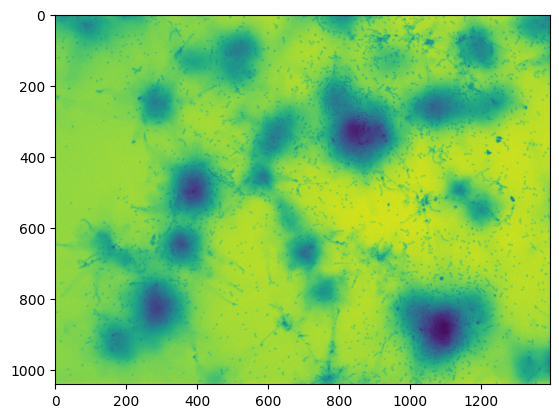

In [17]:
for this_image in my_images:
    plt.imshow(this_image)
    plt.show()

# U-Net: A Brief Exploration presentation 2025-09-25
Clark Kashuk - Informatics Data Scientist, Radiology

U-Net is a convolutional neural network developed for image segmentation, optimized for lower number of images in training.

Neural networks are basically signal processing filters.

Segmentation is used to find regions of interest in an image.